# Integration of spatial transcriptomics data - Nanopore

## ScNaST

Follow Scanpy workflow, using output from scNapBar/scNaST.
Assign missing labels using scANVI.
___

In [1]:
import os
import sys
import logging
import json
import yaml

from pathlib import Path

from collections import defaultdict

def get_ipython_logger(logging_level='DEBUG', format_str='%(levelname)-8s : %(message)s'):

    level = logging.getLevelName(logging_level)
    formatter = logging.Formatter(format_str)
    
    logger = logging.getLogger()
    logger.setLevel(level)

    # clear whatever handlers were there
    while len(logger.handlers):
        logger.removeHandler(logger.handlers[0])
    
    #h_out = logging.StreamHandler(sys.stdout)
    h_err = logging.StreamHandler(sys.stderr)

    #logger.addHandler(h_out)
    logger.addHandler(h_err)

    for h in logger.handlers:
        h.setFormatter(formatter)

    return logger

logger = get_ipython_logger(logging_level='INFO')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [3]:
import scanpy as sc

import anndata

import numpy as np
import pandas as pd
import scipy as sp
import scipy.io

import scvi

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white', frameon=False)

scanpy==1.7.2 anndata==0.7.6 umap==0.5.1 numpy==1.20.3 scipy==1.6.3 pandas==1.2.4 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.9.1


In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

mpl_logger = logging.getLogger('matplotlib')
mpl_logger.setLevel(logging.ERROR) 

from matplotlib import colors

# from Scrublet
def darken_cmap(cmap, scale_factor):
    cdat = np.zeros((cmap.N, 4))
    for ii in range(cdat.shape[0]):
        curcol = cmap(ii)
        cdat[ii,0] = curcol[0] * scale_factor
        cdat[ii,1] = curcol[1] * scale_factor
        cdat[ii,2] = curcol[2] * scale_factor
        cdat[ii,3] = 1
    cmap = cmap.from_list(cmap.N, cdat)
    return cmap
cmaps = darken_cmap(plt.cm.Reds, 0.9)

bone_reversed = plt.cm.get_cmap('bone_r')

In [5]:
def p_scatter(adata, x='n_counts', y='n_genes', hue='pct_mt', 
              xl='Count depth (raw)', yl='Number of genes', title='Fraction MT counts',
              mxx=None, mxy=None, show=False):
    ax = sc.pl.scatter(adata,
                       x, 
                       y, 
                       color=hue, 
                       show=show)
    ax.set_title(title)
    ax.set_xlabel(xl)
    ax.set_ylabel(yl)
    if mxx is not None:
        ax.set_xlim(0, mxx)
    if mxy is not None:
        ax.set_ylim(0, mxy)
        
    fig = ax.get_figure()
    return fig

def p_hist(adata, stat='count', x1='n_genes', x2='n_counts', x3='pct_mt', 
           xl1='No. of genes per cell', xl2='Counts per cell', xl3='MT read fraction per cell'):
    
    from matplotlib.offsetbox import AnchoredText
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), sharey=False)
    
    d = sns.histplot(adata.obs[x1], kde=True, ax=ax1, stat=stat)
    ax1.axvline(np.median(adata.obs[x1]), color='k', linestyle='--')
    ax1.set_ylabel('')
    ax1.set_yticklabels([])
    
    x = d.lines[0].get_xdata() 
    y = d.lines[0].get_ydata() 
    maxid = np.argmax(y) 
    anc = AnchoredText(f"Median {int(np.median(adata.obs[x1]))}\nPeak {int(x[maxid])}\nMode {adata.obs[x1].mode().tolist()[0]}", 
                       loc="upper right", frameon=False, prop=dict(size=10))
    ax1.add_artist(anc)
    
    d = sns.histplot(adata.obs[x2], kde=True, ax=ax2, stat=stat)
    ax2.axvline(np.median(adata.obs[x2]), color='k', linestyle='--')
    ax2.set_ylabel('')
    ax2.set_yticklabels([])
    
    x = d.lines[0].get_xdata() 
    y = d.lines[0].get_ydata() 
    maxid = np.argmax(y) 
    anc = AnchoredText(f"Median {int(np.median(adata.obs[x2]))}\nPeak {int(x[maxid])}\nMode {adata.obs[x2].mode().tolist()[0]}", 
                       loc="upper right", frameon=False, prop=dict(size=10))
    ax2.add_artist(anc)
    
    d = sns.histplot(adata.obs[x3], kde=True, ax=ax3, stat=stat)
    ax3.axvline(np.median(adata.obs[x3]), color='k', linestyle='--')
    ax3.set_ylabel('')
    ax3.set_yticklabels([])
    
    x = d.lines[0].get_xdata() 
    y = d.lines[0].get_ydata() 
    maxid = np.argmax(y) 
    anc = AnchoredText(f"Median {np.median(adata.obs[x3]):.2}\nPeak {x[maxid]:.2}\nMode {adata.obs[x3].mode().tolist()[0]:.2}", 
                       loc="upper left", frameon=False, prop=dict(size=10))
    ax3.add_artist(anc)
    
    ax1.title.set_text(xl1)
    ax2.title.set_text(xl2)
    ax3.title.set_text(xl3)
    
    return fig


In [6]:
names = ['var_names', 'qry_id', 'ref_id', 'qry_gene_id', 'ref_gene_id', 'ref_gene_name', 'class_code']

def read_and_qc(sample, library_id, inloc, outloc,
                mt_genes, mt_frac_thr,
                min_counts, max_counts, min_genes, max_genes, min_cells,
                plot=False, no_qc=False):
    
    # load data into AnnData fmt
    # use the built-in read_visium
    # genome=None Filter expression to genes within this genome
    # source_image_path=None Path to the high-resolution tissue image spatial/tissue_hires_image.png
    # load_images=True by default
    adata = sc.read_visium(inloc,
                           count_file='filtered_feature_bc_matrix.h5',
                           library_id=library_id) 
    adata.var_names_make_unique()
    
    # add to adata.obs
    filen = os.path.join(inloc, '..', 'feature_bc_matrix', 'features_annotated.tsv.gz')
    var = pd.read_csv(filen, sep='\t', header=None, names=names[1:], index_col=0)
    adata.var = adata.var.join(var)
    del adata.var['gene_ids']
    
    adata.obs['n_counts'] = adata.X.sum(1)
    adata.obs['n_transcripts'] = (adata.X > 0).sum(1)
    mito_genes = adata.var.ref_gene_name.str.startswith(mt_genes, na=False)
    adata.obs['pct_mt'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
    
    logger.info(f"{sample}: (Raw) View of AnnData object with n_obs × n_vars {adata.shape}")
    
    if plot:
        fig = p_scatter(adata, y='n_transcripts', yl='No. of transcripts')
        filen = os.path.join(outloc, 'results', 'figures', f"scatter_pre_{sample}.pdf")
        fig.savefig(filen, bbox_inches = "tight")
        filen = os.path.join(outloc, 'results', 'figures', f"scatter_pre_{sample}.svg")
        fig.savefig(filen, bbox_inches = "tight")

        fig = p_hist(adata, x1='n_transcripts', xl1='No. of transcripts per spot', xl2='Counts per spot')
        filen = os.path.join(outloc, 'results', 'figures', f"hist_pre_{sample}.pdf")
        fig.savefig(filen, bbox_inches = "tight")
        filen = os.path.join(outloc, 'results', 'figures', f"hist_pre_{sample}.svg")
        fig.savefig(filen, bbox_inches = "tight")        
        
    if no_qc:
        return adata
        
    # filter
    adata = adata[adata.obs['pct_mt'] < mt_frac_thr]
    sc.pp.filter_cells(adata, min_counts=min_counts)
    sc.pp.filter_cells(adata, max_counts=max_counts)
    sc.pp.filter_cells(adata, min_genes=min_genes)
    sc.pp.filter_cells(adata, max_genes=max_genes)
    sc.pp.filter_genes(adata, min_cells=min_cells)
    
    # update metrics
    adata.obs['n_counts'] = adata.X.sum(1)
    adata.obs['n_transcripts'] = (adata.X > 0).sum(1)
    mito_genes = adata.var.ref_gene_name.str.startswith(mt_genes, na=False)
    adata.obs['pct_mt'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
    
    if plot:
        fig = p_scatter(adata, y='n_transcripts', yl='No. of transcripts')
        filen = os.path.join(outloc, 'results', 'figures', f"scatter_post_{sample}.pdf")
        fig.savefig(filen, bbox_inches = "tight")
        filen = os.path.join(outloc, 'results', 'figures', f"scatter_post_{sample}.svg")
        fig.savefig(filen, bbox_inches = "tight")

        fig = p_hist(adata, x1='n_transcripts', xl1='No. of transcripts per spot', xl2='Counts per spot')
        filen = os.path.join(outloc, 'results', 'figures', f"hist_post_{sample}.pdf")
        fig.savefig(filen, bbox_inches = "tight")
        filen = os.path.join(outloc, 'results', 'figures', f"hist_post_{sample}.svg")
        fig.savefig(filen, bbox_inches = "tight")
    
    logger.info(f"{sample}: (Filtered) View of AnnData object with n_obs × n_vars {adata.shape}")
        
    return adata


Quality control
---

Read Nanopore `spatial` directory for each sample defined in the config file, and apply standard filtering.

In [7]:
parent = '/prj/Florian_Leuschner_spatial/analysis/Nanopore/' # change this path!

outloc = '/prj/Florian_Leuschner_spatial/analysis/Nanopore/Nanopore' # output directory
outname = 'scnast' # output generic name

config = yaml.load(open(os.path.join(parent, 'ScNaST', 'workflow', 'config.yaml')), Loader=yaml.FullLoader)
samples = config['samples']
ids = {key: key[-1].upper() for key in samples.keys()}
samples = dict((ids[key], os.path.join(str(Path(value).parents[1]), 'analysis', 'spatial')) for (key, value) in samples.items())
samples

{'A': '/prj/Florian_Leuschner_spatial/analysis/Nanopore/VX06_H61211a/analysis/spatial',
 'B': '/prj/Florian_Leuschner_spatial/analysis/Nanopore/VX06_H61211b/analysis/spatial',
 'C': '/prj/Florian_Leuschner_spatial/analysis/Nanopore/VX06_H61211c/analysis/spatial',
 'D': '/prj/Florian_Leuschner_spatial/analysis/Nanopore/VX06_H61211d/analysis/spatial'}

reading /prj/Florian_Leuschner_spatial/analysis/Nanopore/VX06_H61211a/analysis/spatial/filtered_feature_bc_matrix.h5
 (0:00:00)
/tmp/ipykernel_37405/3005419141.py:27: RuntimeWarning: invalid value encountered in true_divide
  adata.obs['pct_mt'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
INFO     : VX06_H61211a: (Raw) View of AnnData object with n_obs × n_vars (1993, 127591)
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'ref_id' as categorical
... storing 'qry_gene_id' as categorical
... storing 'ref_gene_id' as categorical
... storing 'ref_gene_name' as categorical
... storing 'class_code' as categorical
filtered out 34 cells that have less than 50 counts
Trying to set attribute `.obs` of view, copying.
filtered out 9 cells that have more than 2000 counts
filtered out 22 cells that have less than 50 genes expressed
filtered out 8 cells that have more than 1000 genes expressed
filtered out 106154 genes that are 

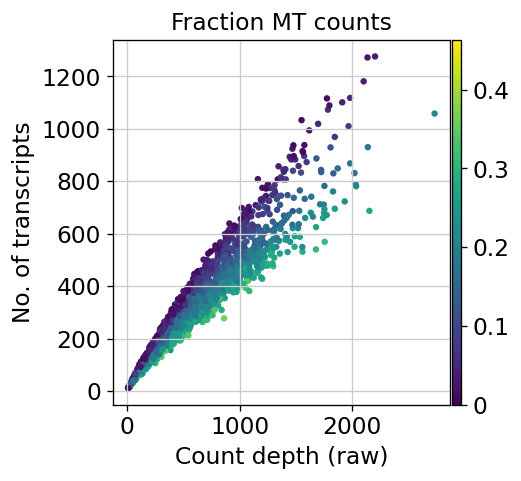

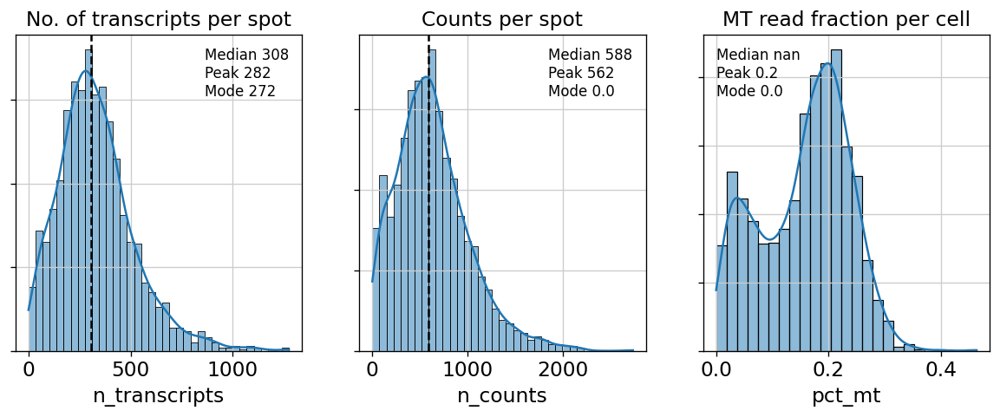

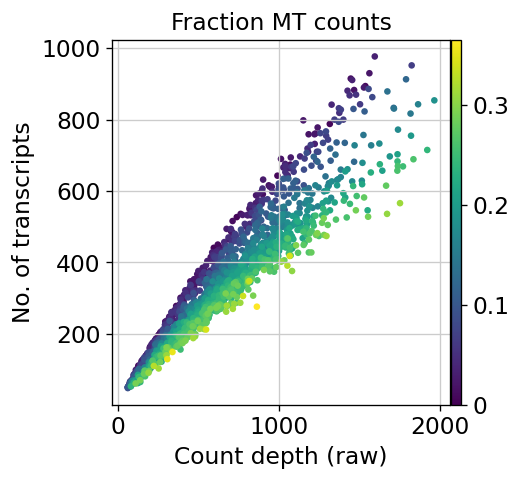

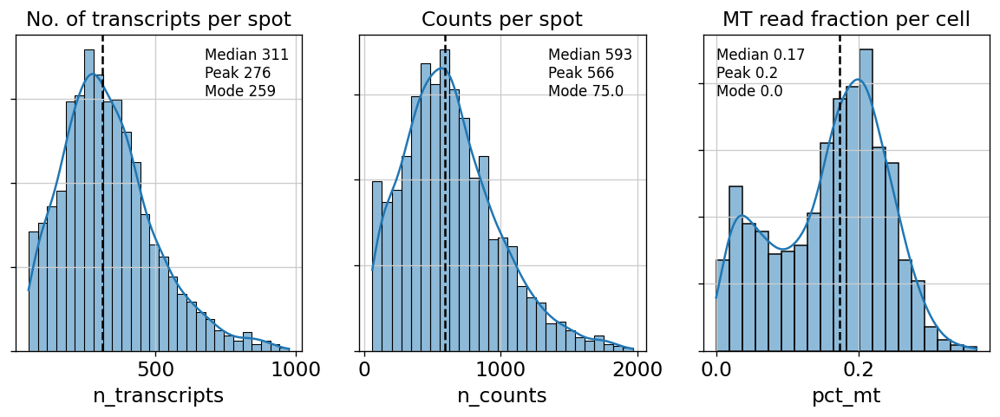

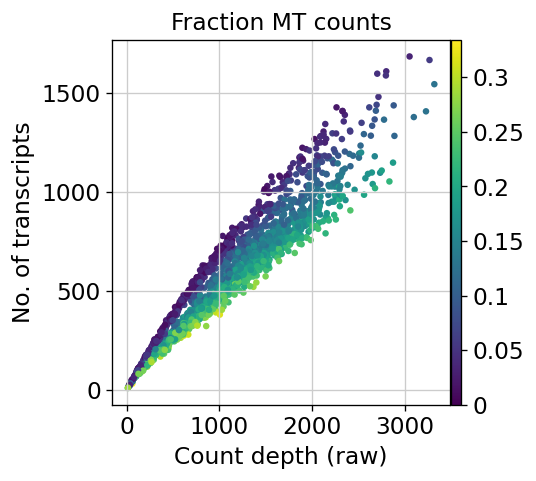

...

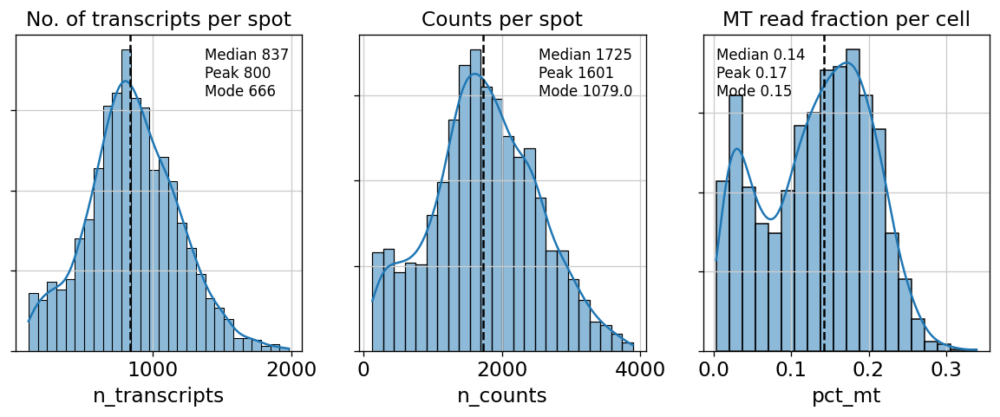

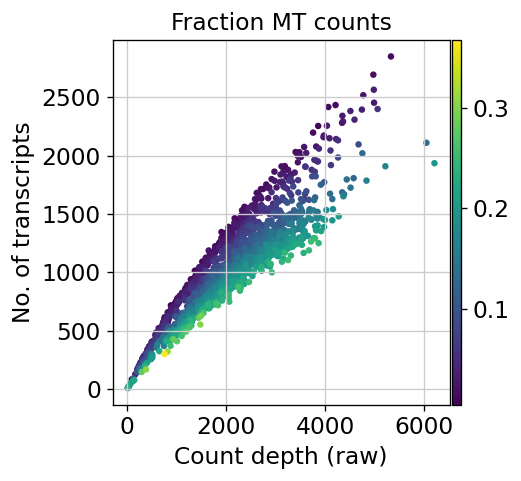

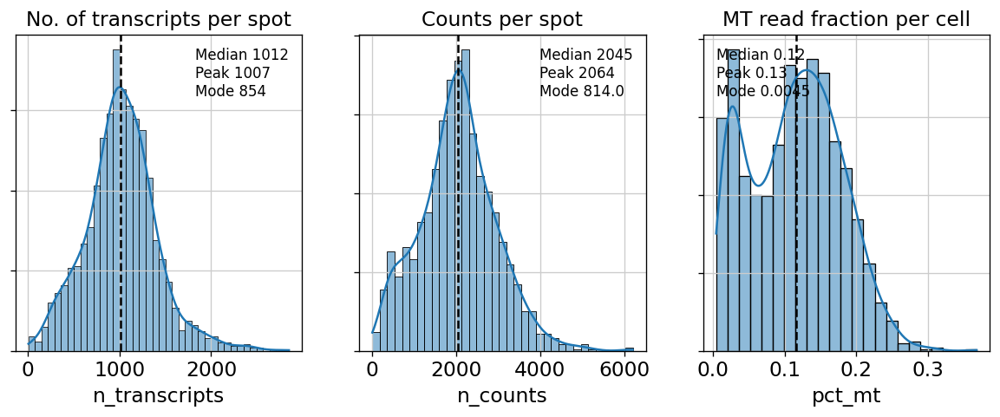

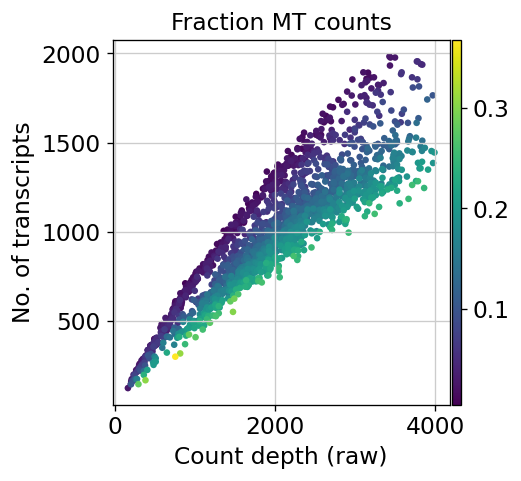

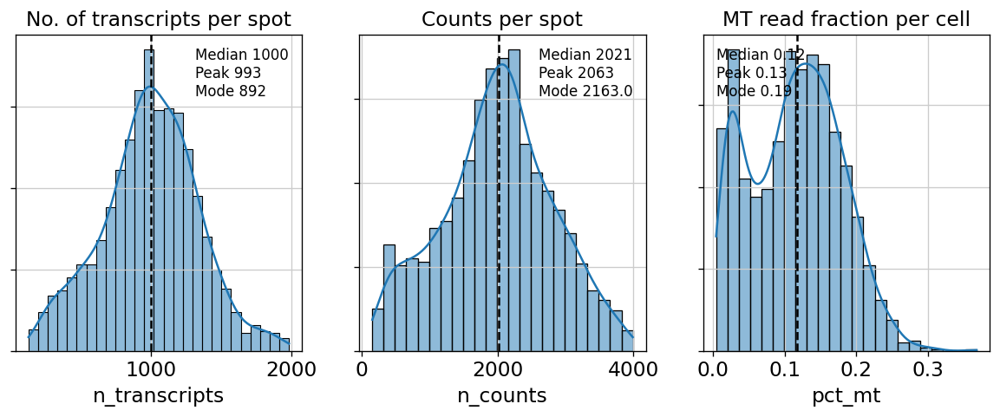

In [76]:
# Filtering
# For heart samples, a MT fraction cutoff of 20-30% is often used, or even higher, consistently with observations made earlier 
# that in tissues with high energy demand the MT fraction can reach up to 30% or more.
# Unless we find strong indications that the cells are stressed, apoptotic, or dying, we can assume that the high MT fraction is related to
# a biologically relevant mitochondrial activity. See also 10.1093/bioinformatics/btaa751
mt_frac_thr = 0.4
# These are defined per sample, since we have varying library depth for each slice/sample.
min_counts = {'VX06_H61211a': 50, 
              'VX06_H61211b': 50, 
              'VX06_H61211c': 100, 
              'VX06_H61211d': 100}
max_counts = {'VX06_H61211a': 2000, 
              'VX06_H61211b': 2500, 
              'VX06_H61211c': 4000, 
              'VX06_H61211d': 4000}
min_genes = {'VX06_H61211a': 50, 
             'VX06_H61211b': 50, 
             'VX06_H61211c': 100, 
             'VX06_H61211d': 100}
max_genes = {'VX06_H61211a': 1000, 
             'VX06_H61211b': 1500, 
             'VX06_H61211c': 2000, 
             'VX06_H61211d': 2000}
min_cells = 2

# Read the data into AnnData objects
# We use filtered visium dataset, i.e. the output of SpaceRanger that contains only spots within the tissue slices
slides = []
for s, p in samples.items():
    sample = os.path.basename(str(Path(p).parents[1]))
    slide = read_and_qc(sample=sample, 
                        library_id=s, 
                        inloc=p, 
                        outloc=outloc,
                        mt_genes='mt-', 
                        mt_frac_thr=mt_frac_thr,
                        min_counts=min_counts[sample], 
                        max_counts=max_counts[sample], 
                        min_genes=min_genes[sample], 
                        max_genes=max_genes[sample], 
                        min_cells=min_cells,
                        plot=True, 
                        no_qc=False)
    slides.append(slide)
    

Concatenate and normalize
---

Find HVG on the concatenated object.


In [78]:
# first concatenate - 
# combine AnnData objects together
adata = slides[0].concatenate(
    slides[1:],
    join='inner', 
    batch_key="library_id",
    uns_merge="unique",
    batch_categories=[
        k
        for d in [
            slides[0].uns["spatial"],
            slides[1].uns["spatial"],
            slides[2].uns["spatial"],
            slides[3].uns["spatial"],
        ]
        for k, v in d.items()
    ],
)
adata


# write counts (full dimension) to disk before normalization/HVG
filen = os.path.join(outloc, "data", f"concatenated_raw_{outname}.h5ad")
adata.write_h5ad(filen)

logger.info(f"Written raw counts to {filen}")

# save as layer
adata.layers["counts"] = adata.X.copy()

AnnData object with n_obs × n_vars = 7616 × 19794
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'n_transcripts', 'pct_mt', 'n_genes', 'library_id'
    var: 'feature_types', 'genome', 'qry_id', 'qry_gene_id', 'ref_gene_name', 'class_code', 'ref_id-A', 'ref_gene_id-A', 'n_cells-A', 'ref_id-B', 'ref_gene_id-B', 'n_cells-B', 'ref_id-C', 'ref_gene_id-C', 'n_cells-C', 'ref_id-D', 'ref_gene_id-D', 'n_cells-D'
    uns: 'spatial'
    obsm: 'spatial'

INFO     : Written raw counts to /prj/Florian_Leuschner_spatial/analysis/Nanopore/Nanopore/data/concatenated_raw_scnast.h5ad


In [79]:
# Normalization standard workflow
# We proceed to normalize Visium counts data with the built-in normalize_total method from Scanpy, and detect highly-variable genes. 
# Although the variance in molecular counts across spots is not just technical in nature, but also could depend on the tissue anatomy,
# other methods e.g. SCTransform do not seem a priori to outperform standard normalization + integration/batch correction e.g. using BBKNN
target_sum = 1e4
sc.pp.normalize_total(adata, 
                      target_sum=target_sum, 
                      exclude_highly_expressed=True)
sc.pp.log1p(adata)

# keep full dimension safe
adata.raw = adata
# the idea is to avoid including batch specific genes in the analysis...
sc.pp.highly_variable_genes(adata, batch_key="library_id")

logger.info(f"View of AnnData object with n_obs × n_vars {adata.shape}")

# keep the union
nbatches = 0 # or e.g. genes that are variable in at least 2 datasets nbatches = 2
adata = adata[:,adata.var.highly_variable_nbatches > nbatches]

logger.info(f"View of AnnData object with n_obs × n_vars {adata.shape}")


normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['MSTRG.72.6:Col19a1', 'MSTRG.73.2:Col19a1', 'MSTRG.73.3:Col19a1', 'ENSMUST00000087883:Col3a1', 'ENSMUST00000086430:Col5a2', 'ENSMUST00000074669:Hnrnpab', 'MSTRG.2466.1:Sparc', 'ENSMUST00000018437:Pfn1', 'ENSMUST00000004145:Stat5a', 'MSTRG.5766.1:Gm10076', 'ENSMUST00000024698:Tnfrsf12a', 'ENSMUST00000088307:BC003965', 'MSTRG.7712.1:Gm26917', 'ENSMUST00000103230:Nppa', 'ENSMUST00000031668:Col1a2', 'ENSMUST00000003521:Rps11', 'ENSMUST00000094434:Ftl1', 'ENSMUST00000035836:Inppl1', 'ENSMUST00000034834:Pkm', 'ENSMUST00000007139:Eif1b', 'MSTRG.18711.1:mt-Co1', 'MSTRG.18712.1:mt-Nd5', 'MSTRG.18712.4:mt-Nd6', 'ENSMUST00000084013:mt-Nd4l', 'ENSMUST00000082414:mt-Nd4', 'ENSMUST00000033741:Bgn']
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
   

Label assignment 
---

*Transfer* the Illumina labels (anatomical regions and deconvoluted cell types) to the Nanopore data (based on the scNapBar assignments).

**Note:** Due to standard quality filtering of data, the final set of assigned barcodes is not necessarily matching between a given Illumina and Nanopore sample, *e.g.* barcode X remains in the Nanopore but has been filtered out from the Illumina. We assign Nanopore-only barcodes using seed labeling.

In [80]:
filen = '/prj/Florian_Leuschner_spatial/analysis/Illumina/data/anatomical_regions_and_cell_props_bbknn.h5ad' # change this path!
illumina = sc.read_h5ad(filen)
illumina

AnnData object with n_obs × n_vars = 7708 × 8160
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'n_genes', 'pct_mt', 'library_id', 'anatomical_region'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells-A', 'n_cells-B', 'n_cells-C', 'n_cells-D', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'anatomical_region_colors', 'dendrogram_anatomical_region', 'leiden', 'library_id_colors', 'neighbors', 'pca', 'ranked_anatomical_region', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'deconvolution', 'spatial'
    varm: 'PCs'
    layers: 'X_explained', 'counts'
    obsp: 'connectivities', 'distances'

In [90]:
obs = illumina.obs.reindex(adata.obs.index)
adata.obs = adata.obs.join(obs[['anatomical_region']])

cat = adata.obs.anatomical_region.cat.categories.values
cat = np.append(cat, 'Unknown')

adata.obs["seed_labels"] = adata.obs.anatomical_region.values
adata.obs["seed_labels"] = pd.Categorical(adata.obs["seed_labels"], categories=cat)

adata.obs.fillna({'seed_labels': 'Unknown'}, inplace=True)
adata.obs.seed_labels.value_counts()

# add this information to the adata 
flag = np.array(adata.shape[0] * [0])
flag[adata.obs["seed_labels"]=='Unknown'] = 1
adata.obs["nanopore_only"] = flag


Remote zone 1    3029
Remote zone 2    2142
Infarct          1600
Border zone       809
Unknown            36
Name: seed_labels, dtype: int64

In [111]:
# register AnnData for use in scANVI and run
# admittedly, the number of unknown labels is quite small... we could've used something simpler...
scvi.model.SCVI.setup_anndata(adata, 
                              batch_key='library_id', 
                              labels_key="seed_labels",
                              layer="counts")
# without GPUs this will only take ~15 min...
scvi_model = scvi.model.SCVI(adata, 
                             n_latent=15, 
                             n_layers=2)
scvi_model.train()

INFO     : Unable to initialize backend 'tpu_driver': NOT_FOUND: Unable to find driver in registry given worker: 
INFO     : Unable to initialize backend 'gpu': NOT_FOUND: Could not find registered platform with name: "cuda". Available platform names are: Host Interpreter
INFO     : Unable to initialize backend 'tpu': INVALID_ARGUMENT: TpuPlatform is not available.
/home/eboileau/.virtualenvs/sc3.9_spatial/lib/python3.9/site-packages/scvi/data/fields/_layer_field.py:78: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
INFO     : GPU available: False, used: False
INFO     : TPU available: False, using: 0 TPU cores
INFO     : IPU available: False, using: 0 IPUs


Epoch 1/400:   0%|          | 0/400 [00:00<?, ?it/s]

/home/eboileau/.virtualenvs/sc3.9_spatial/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 400/400: 100%|██████████| 400/400 [21:46<00:00,  3.27s/it, loss=1.3e+03, v_num=1] 


In [116]:
# transfer the labels
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')
scanvi_model.train(50)

adata.obs["C_scANVI"] = scanvi_model.predict(adata)
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

# keep the actual regions from scNapBar-assigned (matched) barcodes 
# and "transfer" the scANVI labels for the Nanopore-only barcodes
adata.obs.anatomical_region.fillna(adata.obs.C_scANVI, inplace=True)

/home/eboileau/.virtualenvs/sc3.9_spatial/lib/python3.9/site-packages/scvi/data/fields/_layer_field.py:78: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
/home/eboileau/.virtualenvs/sc3.9_spatial/lib/python3.9/site-packages/scvi/model/_scanvi.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  labels == self.unlabeled_category_
/home/eboileau/.virtualenvs/sc3.9_spatial/lib/python3.9/site-packages/scvi/model/_scanvi.py:255: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  self._labeled_indices = np.argwhere(labels != self.unlabeled_category_).ravel()


INFO     Training for 50 epochs.                                                             


INFO     : Training for 50 epochs.
INFO     : GPU available: False, used: False
INFO     : TPU available: False, using: 0 TPU cores
INFO     : IPU available: False, using: 0 IPUs


Epoch 1/50:   0%|          | 0/50 [00:00<?, ?it/s]

/home/eboileau/.virtualenvs/sc3.9_spatial/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:433: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 50/50: 100%|██████████| 50/50 [03:34<00:00,  4.30s/it, loss=1.33e+03, v_num=1]


In [196]:
# adjust the deconvolution results
cell_type = illumina.obsm['deconvolution'].reindex(adata.obs.index)
adata.obsm['deconvolution'] = cell_type

In [198]:
adata

AnnData object with n_obs × n_vars = 7616 × 12590
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'n_transcripts', 'pct_mt', 'library_id', 'anatomical_region', 'seed_labels', 'nanopore_only', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'feature_types', 'genome', 'qry_id', 'qry_gene_id', 'ref_gene_name', 'class_code', 'ref_id-A', 'ref_gene_id-A', 'n_cells-A', 'ref_id-B', 'ref_gene_id-B', 'n_cells-B', 'ref_id-C', 'ref_gene_id-C', 'n_cells-C', 'ref_id-D', 'ref_gene_id-D', 'n_cells-D', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'spatial', 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'region_colors', 'anatomical_region_colors', 'C_scANVI_colors', 'library_id_colors', 'tmp_colors', 'tmp', 'ranked_anatomical_region'
    obsm: 'spatial', 'X_scANVI', 'X_umap', 'deconvolution'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

Dimensionality reduction 
---

Compute neighours and UMAP using scANVI represenation, use *mapped* regions to recover infarct, border and remote zones. 

In [119]:
sc.pp.neighbors(adata, use_rep="X_scANVI") 
sc.tl.umap(adata, min_dist=0.1, spread=.6) 


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


In [133]:
# set colors for plotting

adata.uns['anatomical_region_colors'] = ["#3498db", "#95a5a6", "#e74c3c", "#2ecc71"]
adata.obs['C_scANVI'].cat.reorder_categories(adata.obs.anatomical_region.cat.categories, inplace=True)
adata.uns['C_scANVI_colors'] = ["#3498db", "#95a5a6", "#e74c3c", "#2ecc71"]

clusters_colors = dict(
    zip([str(i) for i in range(18)], adata.uns["anatomical_region_colors"])
)

In [139]:
# sc.pl.umap(adata, color=["anatomical_region", "C_scANVI"], title=['Anatomical region', 'scANVI'], ncols=1, save=f'_transfer_{outname}.pdf')
# sc.pl.umap(adata, color=["anatomical_region", "C_scANVI"], title=['Anatomical region', 'scANVI'], ncols=1, save=f'_transfer_{outname}.svg')

[<AxesSubplot:title={'center':'A'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'B'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'C'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'D'}, xlabel='spatial1', ylabel='spatial2'>]

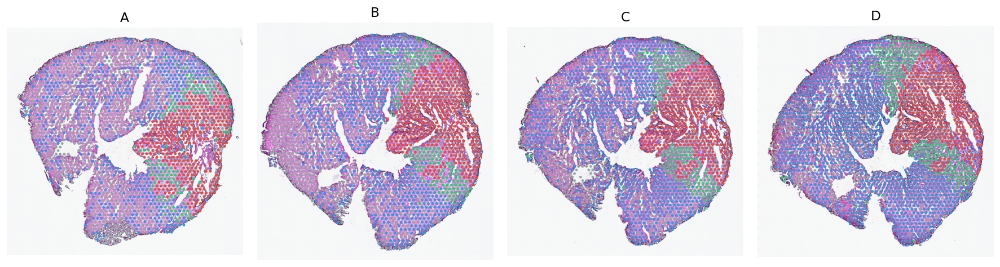

In [150]:
fig, axs = plt.subplots(1, 4, figsize=(15, 10))

for i, library in enumerate(
    ['A', 'B', 'C', 'D']
):
    ad = adata[adata.obs.library_id == library, :].copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=library,
        color="anatomical_region",
        title=library,
        #size=1.5,
        palette=[
            v
            for k, v in clusters_colors.items()
            if k in ad.obs.anatomical_region.unique().tolist()
        ],
        legend_loc=None,
        show=False,
        ax=axs[i],
    )

plt.tight_layout()

In [151]:
for ext in ['pdf', 'svg']:
    filen = os.path.join(outloc, 'results', 'figures', f"spatial_clusters_{outname}.{ext}")
    fig.savefig(filen, bbox_inches = "tight")

[<AxesSubplot:title={'center':'A'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'B'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'C'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'D'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'A'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'B'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'C'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'D'}, xlabel='spatial1', ylabel='spatial2'>]

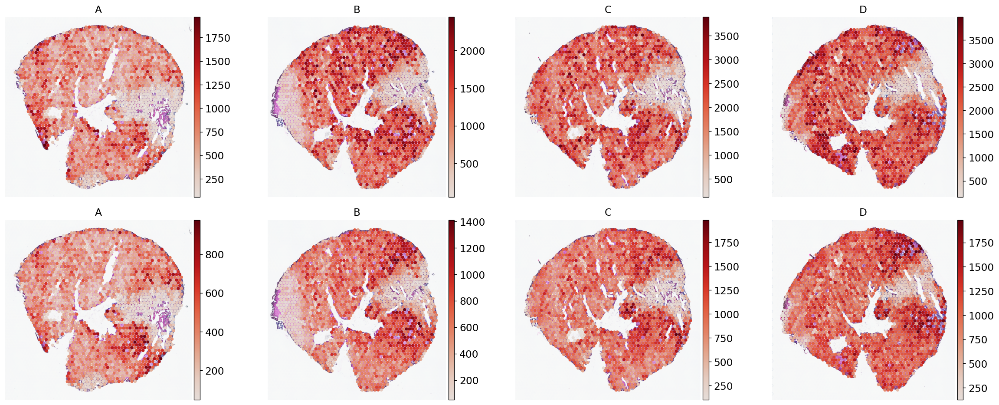

In [152]:
fig, axs = plt.subplots(2, 4, figsize=(20, 8))

for i, library in enumerate(
    ['A', 'B', 'C', 'D']
):
    ad = adata[adata.obs.library_id == library, :].copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=library,
        color="n_counts",
        size=1.5,
        title=library,
       # vmin=1000,
       # vmax=15000,
        color_map=cmaps,
        legend_loc=None,
        show=False,
        ax=axs[0,i],
    )

for i, library in enumerate(
    ['A', 'B', 'C', 'D']
):
    ad = adata[adata.obs.library_id == library, :].copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=library,
        color="n_transcripts",
        size=1.5,
        title=library,
       # vmin=500,
       # vmax=4500,
        color_map=cmaps,
        legend_loc=None,
        show=False,
        ax=axs[1,i],
    )
    
plt.tight_layout()



In [153]:
for ext in ['pdf', 'svg']:
    filen = os.path.join(outloc, 'results', 'figures', f"spatial_counts_{outname}.{ext}")
    fig.savefig(filen, bbox_inches = "tight")

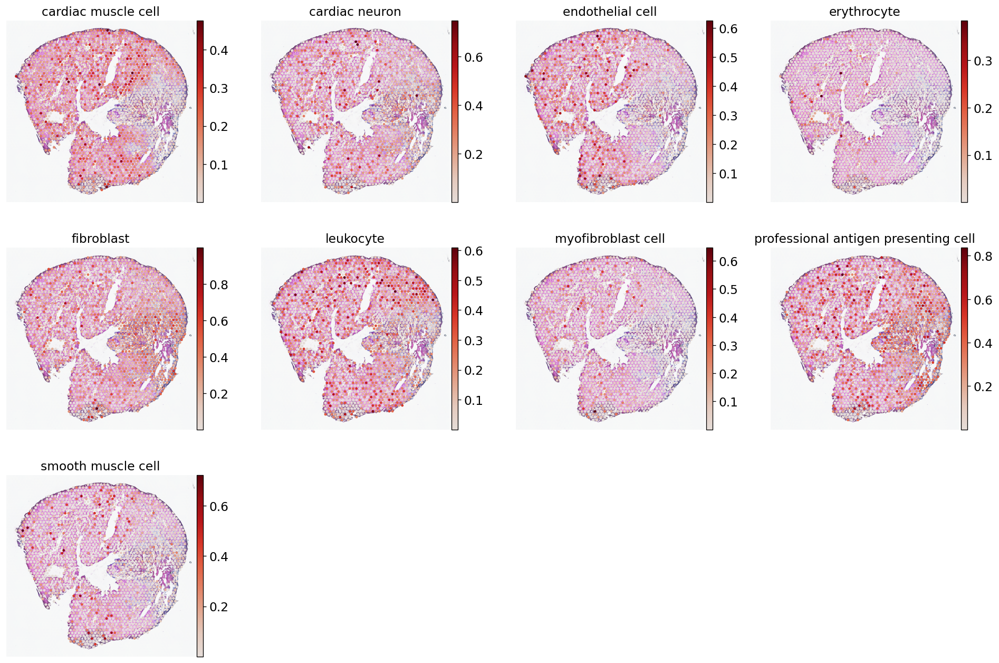

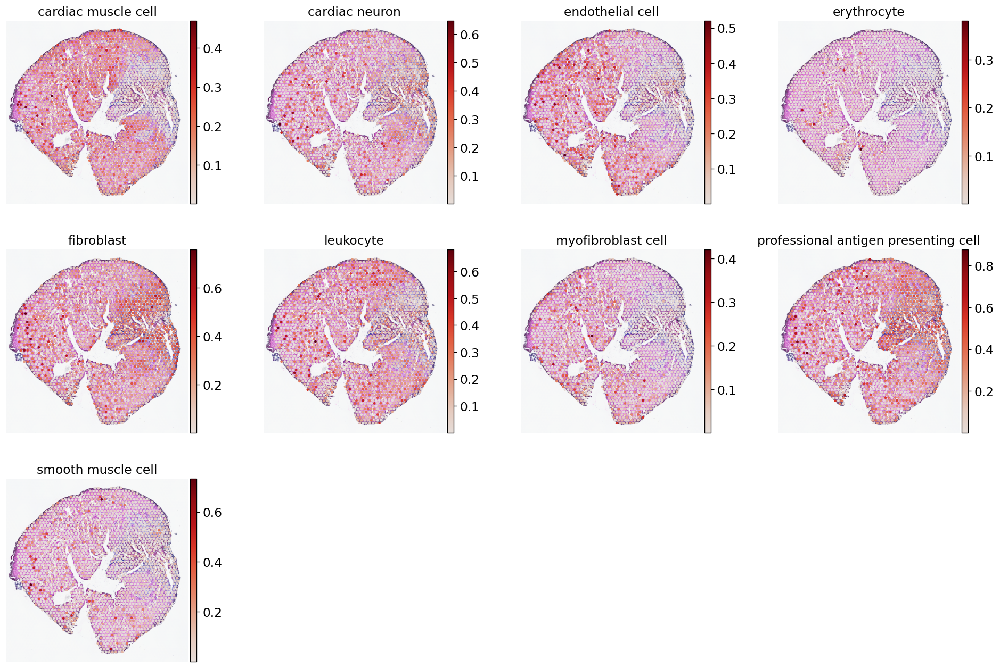

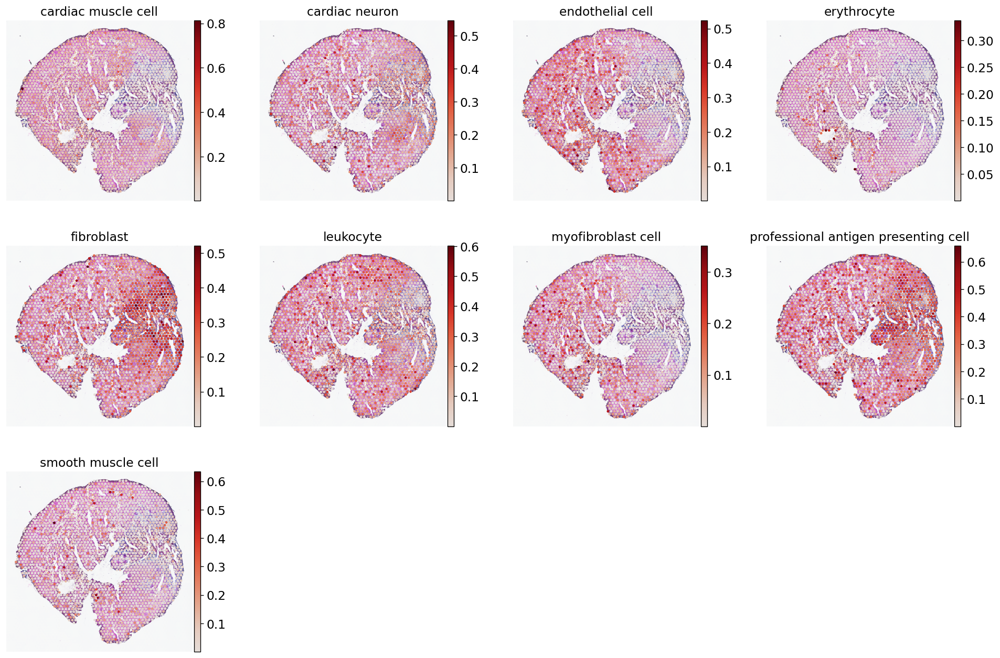

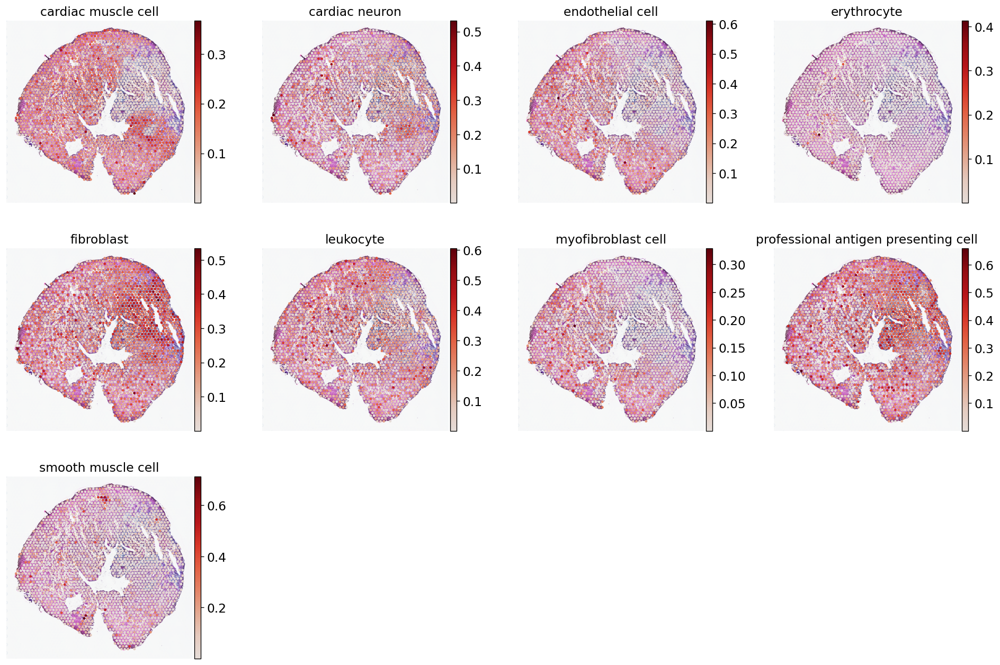

In [201]:
# inferred cell proportion from Tabula Muris - transfered from Illumina

for ct in adata.obsm["deconvolution"].columns:
        adata.obs[ct] = adata.obsm["deconvolution"][ct]
        
cell_types = ['cardiac muscle cell', 'cardiac neuron', 'endothelial cell', 
              'erythrocyte', 'fibroblast', 'leukocyte', 'myofibroblast cell',
              'professional antigen presenting cell', 'smooth muscle cell']

for i, library in enumerate(
    ['A', 'B', 'C', 'D']
):
    ad = adata[adata.obs.library_id == library, :].copy()
    sc.pl.spatial(ad, 
                  img_key = "hires", 
                  library_id = library,
                  color = cell_types, 
                  size = 1.2, 
                  color_map = cmaps,
                  save = f"stereoscope_{library}_{outname}.svg")


Figures and save data
---

Clean some fields and write to disk.

In [237]:
# clean and write to disk
del adata.obs['seed_labels']
del adata.obs['_scvi_batch']
del adata.obs['_scvi_labels']

del adata.obs['cardiac muscle cell']
del adata.obs['cardiac neuron']
del adata.obs['endocardial cell']
del adata.obs['endothelial cell']
del adata.obs['erythrocyte']
del adata.obs['fibroblast']
del adata.obs['leukocyte']
del adata.obs['myofibroblast cell']
del adata.obs['professional antigen presenting cell']
del adata.obs['smooth muscle cell']

# subscripted values were not well handled, but they are all the same anyway
adata.var = adata.var[['feature_types',
 'genome',
 'qry_id',
 'ref_id-A',
 'qry_gene_id',
 'ref_gene_id-A',
 'ref_gene_name',  
 'class_code',
 'n_cells-A',
 'n_cells-B',
 'n_cells-C',
 'n_cells-D']]
adata.var.rename(columns={'ref_id-A': 'ref_id', 'ref_gene_id-A': 'ref_gene_id'}, inplace=True)

raw = adata.raw.to_adata()
raw.var = raw.var[['feature_types',
 'genome',
 'qry_id',
 'ref_id-A',
 'qry_gene_id',
 'ref_gene_id-A',
 'ref_gene_name',  
 'class_code',
 'n_cells-A',
 'n_cells-B',
 'n_cells-C',
 'n_cells-D']]
raw.var.rename(columns={'ref_id-A': 'ref_id', 'ref_gene_id-A': 'ref_gene_id'}, inplace=True)
adata.raw = raw

 
del adata.uns['log1p']
del adata.uns['_scvi_uuid']
del adata.uns['_scvi_manager_uuid']

In [252]:
filen = os.path.join(outloc, "data", f"anatomical_regions_and_cell_props_{outname}.h5ad")
adata.write_h5ad(filen)


In [546]:
# add some metrics e.g. class codes, number of isoforms per region, etc.
# usa raw attribute 

raw = adata.raw.to_adata()


In [521]:
sns.set_style("white")

nice_names = {
    '=': 'Complete', 'c': 'Contained', 'k': 'Containment',
    'm': 'Retained', 'n': 'Retained (partial)', 'j': 'Multi-exon',
    'e': 'Single', 'o': 'Overlap', 's': 'Opposite',
    'x': 'Exonic', 'i': 'Intron', 'y': 'Contains', 'p': 'Run-on',
    'r': 'Repeat', 'u': 'Unknown'}

d = pd.DataFrame(raw.var['class_code'].value_counts()) \
        .reset_index().rename(columns={'index':'class', 'class':'count'})
d['description'] = [nice_names[x] for x in d['class']]
d = d[d['class_code']>=20]

<Figure size 960x720 with 0 Axes>

Text(0.5, 0, 'Transcripts (log scale)')

Text(0, 0.5, '')

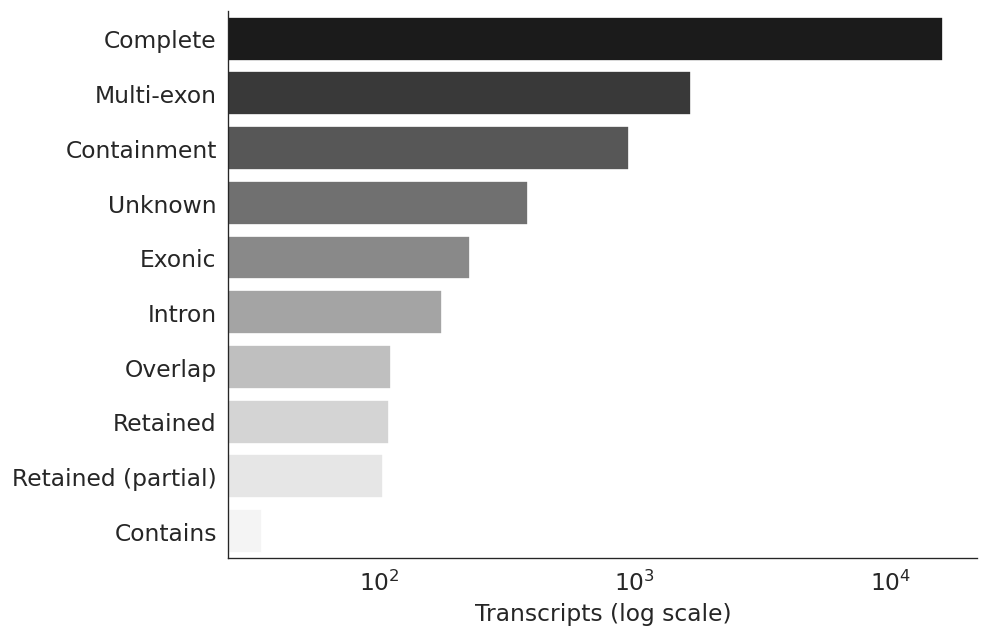

In [522]:
plt.figure(figsize=(8, 6))

palette = sns.color_palette("Greys",n_colors=d.shape[0])
palette.reverse()
ax = sns.barplot(y='description', x="class_code", data=d, log=True, palette=palette)

ax.set_xlabel('Transcripts (log scale)');
ax.set_ylabel('');
sns.despine(ax=ax);

for ext in ['pdf', 'svg']:
    filen = os.path.join(outloc, 'results', 'figures', f"class_codes_raw_{outname}.{ext}")
    plt.savefig(filen, bbox_inches = "tight")

In [299]:
import importlib.util
spec = importlib.util.spec_from_file_location("utils", "/prj/Florian_Leuschner_spatial/analysis/Nanopore/ScNaST/workflow/sc-nanopore-utils/utils/utils.py")
utils = importlib.util.module_from_spec(spec)
spec.loader.exec_module(utils)

In [419]:
# feature annotation (gffcompare)
final_names = [
    'var_names', 
    'transcript_id', 
    'cmp_ref', 
    'gene_id', 
    'ref_gene_id', 
    'gene_name', 
    'class_code']

In [511]:
gtf = pd.read_csv(os.path.join(config['strg_base'], 'gffcompare', 'gffcmp.multi_exons.annotated.gtf'), 
                  sep='\t', 
                  header=None,
                  names=utils.gtf_field_names)
gtf = utils.parse_all_gtf_attributes(gtf, num_cpus=40)
gtf = gtf[gtf.feature=='transcript']
gtf.gene_name.fillna(gtf.cmp_ref_gene, inplace=True)

In [512]:
# use bed file (generated from gtf file)
bed = pd.read_csv('/prj/Florian_Leuschner_spatial/analysis/Nanopore/Nanopore/results/wkdir/gffcmp.multi_exons.annotated.bed', 
                  sep='\t',
                  header=None,
                  names=['chrom', 'chromStart', 'chromEnd', 'transcript_id', 'score', 'strand', 'thickStart', 'thickEnd', 'color', 'blockCount', 'blockSizes', 'blockStarts'])

def get_len(sizes):
    return sum([int(i) for i in sizes.split(',')])

bed['transcript_len'] = bed['blockSizes'].apply(get_len)
gtf = pd.merge(gtf, bed[['transcript_id', 'transcript_len']], on='transcript_id')

In [569]:
# assign class, add to dataframe and compute median transcript length per class
gtf_class = pd.DataFrame(gtf.groupby('ref_gene_id')['transcript_id'].nunique()).reset_index()
gtf_class.rename(columns={'transcript_id': 'class'}, inplace=True)
gtf_class.loc[gtf_class['class']>=10, 'class'] = '10+'
gtf_class['class'] = gtf_class['class'].astype(str)

gtf = pd.merge(gtf, gtf_class, on='ref_gene_id', how='left')
gtf_median_len = pd.DataFrame(gtf.groupby('class')['transcript_len'].median()).reset_index()

# countplot
gtf_countplot = pd.DataFrame(gtf.groupby('ref_gene_id')['transcript_id'].nunique())['transcript_id'].value_counts().to_frame()
gtf_countplot.reset_index(inplace=True)
gtf_countplot.rename(columns={'transcript_id': 'count', 'index':'class'}, inplace=True)

gtf_countplot.iloc[9,1] = gtf_countplot.iloc[9:,:]['count'].sum()
gtf_countplot = gtf_countplot.iloc[:10,:]
gtf_countplot['class'] = gtf_countplot['class'].astype(str)
gtf_countplot.iloc[9,0] = '10+'

In [577]:
# same but for the final Nanopore results

var_class = pd.DataFrame(raw.var.groupby('ref_gene_id')['qry_id'].nunique()).reset_index()
var_class.rename(columns={'qry_id': 'var_class'}, inplace=True)
var_class.loc[var_class['var_class']>=10, 'var_class'] = '10+'
var_class['var_class'] = var_class['var_class'].astype(str)
# unless we use ref_gene_name, we have some NaN, but we need ids to merge with the gtf!
var_class = var_class[var_class['var_class']!='0']
gtf = pd.merge(gtf, var_class, on='ref_gene_id', how='left')
var_median_len = pd.DataFrame(gtf.groupby('var_class')['transcript_len'].median()).reset_index()

var_countplot = pd.DataFrame(raw.var.groupby('ref_gene_id')['qry_id'].nunique())['qry_id'].value_counts().to_frame()
var_countplot.reset_index(inplace=True)
var_countplot.rename(columns={'qry_id': 'count', 'index':'class'}, inplace=True)
var_countplot.sort_values(by='class', inplace=True)
# see above
var_countplot = var_countplot[var_countplot['class']!=0]
var_countplot.iloc[9,1] = var_countplot.iloc[9:,:]['count'].sum()
var_countplot = var_countplot.iloc[:10,:]
var_countplot['class'] = var_countplot['class'].astype(str)
var_countplot.iloc[9,0] = '10+'

In [596]:
gtf_countplot['type'] = 'Assembly'
var_countplot['type'] = 'Used'
count_data = pd.concat([gtf_countplot, var_countplot])

gtf_median_len['type'] = 'Assembly'
var_median_len['type'] = 'Used'
var_median_len.rename(columns={'var_class': 'class'}, inplace=True)

var_median_len = var_median_len.reindex([0,2,3,4,5,6,7,8,9,1])
gtf_median_len = gtf_median_len.reindex([0,2,3,4,5,6,7,8,9,1])
len_data = pd.concat([gtf_median_len, var_median_len])


<Figure size 960x720 with 0 Axes>

Text(0, -20, '962')

Text(0, -20, '1258')

Text(0, -20, '1500')

Text(0, -20, '1523')

Text(0, -20, '1525')

Text(0, -20, '1448')

Text(0, -20, '1400')

Text(0, -20, '1464')

Text(0, -20, '1342')

Text(0, -20, '1324')

Text(0, -20, '1789')

Text(0, -20, '1368')

Text(0, -20, '1153')

Text(0, -20, '1003')

Text(0, -20, '963')

Text(0, -20, '906')

Text(0, -20, '829')

Text(0, -20, '841')

Text(0, 20, '814')

Text(0, 20, '870')

Text(0.5, 0, 'Detected isoforms')

Text(0, 0.5, 'Number of genes (log scale)')

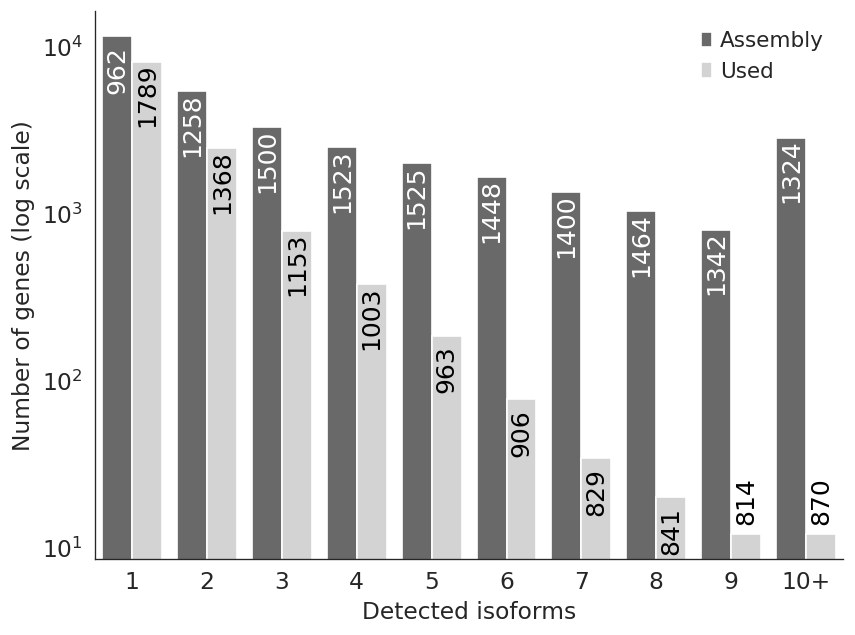

In [600]:
# sns.set_style("white")
plt.figure(figsize=(8, 6))

g = sns.barplot(x="class", y='count', data=count_data, hue='type', log=True, palette={'Assembly':'dimgrey', 'Used':'lightgrey'})

for i, p in enumerate(g.patches):
    color = 'white'
    if i>9:
        color = 'black'
    offset = -20
    if i>=18:
        offset = 20
    g.annotate(format(len_data.iloc[i,1], '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   color = color,
                   size=15,
                   xytext = (0, offset), 
                   rotation=90,
                   textcoords = 'offset points');
    
g.set_xlabel('Detected isoforms');
g.set_ylabel('Number of genes (log scale)');
g.legend(title="", frameon=False);
sns.despine(ax=g);

for ext in ['pdf', 'svg']:
    filen = os.path.join(outloc, 'results', 'figures', f"freq_num_isoforms_raw_{outname}.{ext}")
    plt.savefig(filen, bbox_inches = "tight")

In [ ]:
# get number of isoforms across top marker genes of each region


In [619]:
# first find transcript markers
key_added = 'anatomical_region'
sc.tl.rank_genes_groups(adata, 
                        groupby=key_added, 
                        key_added=f'ranked_{key_added}', 
                        method='wilcoxon', 
                        tie_correct=True,
                        use_raw=True)

ranking genes
    finished: added to `.uns['ranked_anatomical_region']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:46)


In [765]:
dfl = []
for group in adata.uns[f'ranked_{key_added}']['names'].dtype.names:
    cols = {'names':adata.uns[f'ranked_{key_added}']['names'][group], 
            'scores':adata.uns[f'ranked_{key_added}']['scores'][group], 
            'pvals':adata.uns[f'ranked_{key_added}']['pvals'][group], 
            'pvals_adj':adata.uns[f'ranked_{key_added}']['pvals_adj'][group],
            'logfoldchanges':adata.uns[f'ranked_{key_added}']['logfoldchanges'][group],
            'anatomical_region': group}
    dfl.append(pd.DataFrame(cols))
wilcox_region_long = pd.concat(dfl)

def split_names(names):
    return names.split(':')[1]
wilcox_region_long['ref_gene_name'] = wilcox_region_long['names'].apply(split_names)

In [766]:
pval_threshold = 0.05
lfc_threshold = .25
dfl = []
for region, region_df in wilcox_region_long.groupby('anatomical_region'):
    filtered = region_df[(region_df['pvals_adj']<pval_threshold)&(region_df['logfoldchanges']>lfc_threshold)]
    filtered = pd.DataFrame(filtered.groupby('ref_gene_name')['names'].nunique()).reset_index()
    filtered['anatomical_region'] = region
    dfl.append(filtered)
count_region = pd.concat(dfl)

In [767]:
from scipy.stats import mannwhitneyu
pairs = [('Remote zone 1', 'Remote zone 2'), 
         ('Remote zone 1', 'Border zone'),
         ('Remote zone 1', 'Infarct'),
         ('Remote zone 2', 'Border zone'),
         ('Remote zone 2', 'Infarct'),
         ('Border zone', 'Infarct')]
ustats, pval = [], []
for pair in pairs:
    u, p = mannwhitneyu(count_region[count_region.anatomical_region==pair[0]]['names'].values, 
                        count_region[count_region.anatomical_region==pair[1]]['names'].values, 
                        alternative='two-sided')
    ustats.append(u)
    pval.append(p)

In [768]:
def get_star(p):
    s = '-'
    if p < 0.1:
        s = '-'
    if p < 0.01:
        s = '*'
    if p < 0.001:
        s = '**'
    if p < 0.001:
        s = '***'
    if p < 0.0001:
        s = '****'
    return s

Text(1.0, 2.3439240818338676, '****')

Text(1.5, 2.1439240818338674, '****')

Text(1.5, 1.9041666666666668, '***')

Text(2.0, 1.7041666666666668, '***')

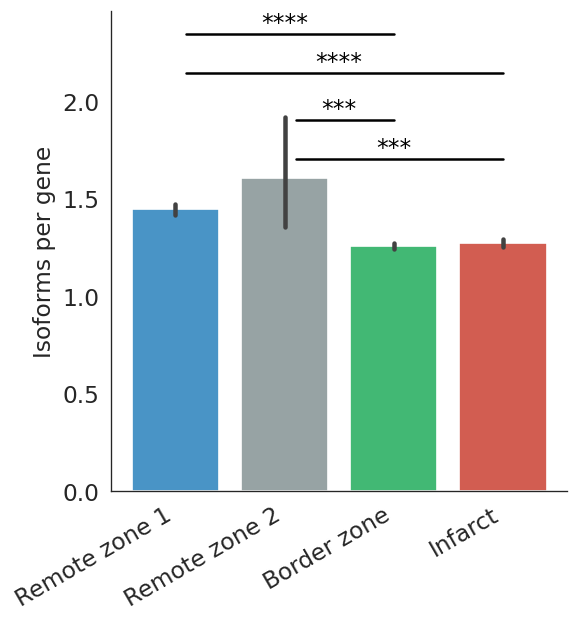

In [769]:
g = sns.catplot(x="anatomical_region", y="names", kind="bar", data=count_region, order=['Remote zone 1', 'Remote zone 2', 'Border zone', 'Infarct'], 
           palette=["#3498db", "#95a5a6", "#2ecc71", "#e74c3c"]);
g.set_xticklabels(rotation=30, horizontalalignment='right');

# we already know which p-values we want to display
# this is easier to adjust the heights and avoid a crowded image
idx = [(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
offset = [1, .9, .7, .3, .1, 0]
for ax in g.axes.flat:
    for i, j in enumerate(idx):
        ps = get_star(pval[i])
        if ps == '-':
            continue
        x1, x2 = j[0], j[1]
        y, h, col = count_region[count_region.anatomical_region==pairs[i][0]]['names'].mean(), offset[i], 'k'
        ax.plot([x1+.1, x2], [y+h, y+h], lw=1.5, c=col);
        ax.text((x1+x2)*.5, y+h, f'{ps}', ha='center', va='bottom', color=col);

g.set(xlabel=None)
g.set(ylabel='Isoforms per gene')

for ext in ['pdf', 'svg']:
    filen = os.path.join(outloc, 'results', 'figures', f"isoforms_pergene_region_{outname}.{ext}")
    g.savefig(filen, bbox_inches = "tight")

In [8]:
# reload data, add ranked dot plot same criteria as Illumina
filen = os.path.join(outloc, "data", f"anatomical_regions_and_cell_props_{outname}.h5ad")
adata = sc.read_h5ad(filen)
adata

AnnData object with n_obs × n_vars = 7616 × 12590
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'n_transcripts', 'pct_mt', 'library_id', 'anatomical_region', 'nanopore_only', 'C_scANVI'
    var: 'feature_types', 'genome', 'qry_id', 'ref_id', 'qry_gene_id', 'ref_gene_id', 'ref_gene_name', 'class_code', 'n_cells-A', 'n_cells-B', 'n_cells-C', 'n_cells-D'
    uns: 'C_scANVI_colors', 'anatomical_region_colors', 'hvg', 'library_id_colors', 'neighbors', 'spatial', 'umap'
    obsm: 'X_scANVI', 'X_umap', 'deconvolution', 'spatial'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [9]:
# first find transcript markers
key_added = 'anatomical_region'
sc.tl.rank_genes_groups(adata, 
                        groupby=key_added, 
                        key_added=f'ranked_{key_added}', 
                        method='wilcoxon', 
                        tie_correct=True,
                        use_raw=True)

ranking genes
    finished: added to `.uns['ranked_anatomical_region']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:47)


In [10]:
# filtering of marker genes
sc.tl.filter_rank_genes_groups(adata,
                               key='ranked_anatomical_region',
                               min_in_group_fraction=0.2,
                               min_fold_change=.2)

Filtering genes using: min_in_group_fraction: 0.2 min_fold_change: 0.2, max_out_group_fraction: 0.5


In [11]:
sc.tl.dendrogram(adata, 'anatomical_region', use_rep='X_scANVI')

Storing dendrogram info using `.uns['dendrogram_anatomical_region']`


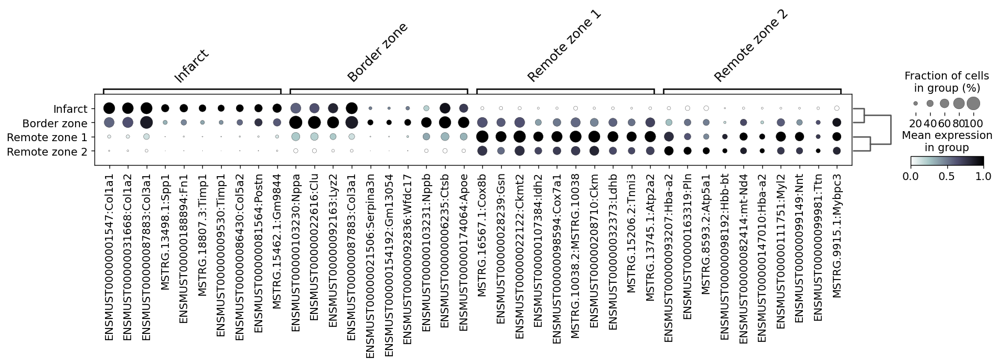

In [15]:
sc.pl.rank_genes_groups_dotplot(adata, 
                                key='rank_genes_groups_filtered', 
                                dendrogram=True,
                                color_map=bone_reversed,
                                standard_scale="var",
                                var_group_rotation=45,
                                save=f'_ranked_markers_{outname}.pdf')